In [1]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"  # 0 = all logs, 3 = only fatal errors
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['NUMEXPR_NUM_THREADS'] = '1'
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import umap
import hdbscan
import joblib
import pickle
from sklearn.cluster import KMeans
import plotly.express as px
import re
from sklearn.metrics import pairwise_distances
from collections import Counter
import ipywidgets as widgets
from IPython.display import display, HTML

In [2]:
fn = './input_data/cert_pl_domains.txt'
df = pd.read_csv(fn, header=None, names=['domain'], dtype=str)
df['domain'] = df['domain'].str.strip()
df = df[df['domain'].notna() & (df['domain'] != '')].drop_duplicates().reset_index(drop=True)
print("Loaded rows:", len(df))
df

Loaded rows: 147501


,domain
0,0-l.x-tut.space
1,000-000-37645t2783296323fn2.calibrescientifics...
2,00080.info
3,007d761bc3.nxcli.io
4,007mailbox.com
...,...
147496,zyzulay.pro
147497,zzgnyc.com
147498,zzgylc.com
147499,zzoobb.de


In [3]:
def extract_parts(d):
    d = d.lower()
    # usuń schema, trailing slashes itp.
    d = re.sub(r'https?://', '', d)
    d = d.split('/')[0]
    return d

df['domain_clean'] = df['domain'].apply(extract_parts)
df['tld'] = df['domain_clean'].str.split('.').str[-1]
df['sld'] = df['domain_clean'].str.split('.').str[-2].fillna('')
df['length'] = df['domain_clean'].str.len()
df['num_parts'] = df['domain_clean'].str.count(r'[.-]') + 1
df['has_digits'] = df['domain_clean'].str.contains(r'\d')
df['has_dash'] = df['domain_clean'].str.contains(r'-|_')
df

,domain,domain_clean,tld,sld,length,num_parts,has_digits,has_dash
0,0-l.x-tut.space,0-l.x-tut.space,space,x-tut,15,5,True,True
1,000-000-37645t2783296323fn2.calibrescientifics...,000-000-37645t2783296323fn2.calibrescientifics...,com,calibrescientifics,50,5,True,True
2,00080.info,00080.info,info,00080,10,2,True,False
3,007d761bc3.nxcli.io,007d761bc3.nxcli.io,io,nxcli,19,3,True,False
4,007mailbox.com,007mailbox.com,com,007mailbox,14,2,True,False
...,...,...,...,...,...,...,...,...
147496,zyzulay.pro,zyzulay.pro,pro,zyzulay,11,2,False,False
147497,zzgnyc.com,zzgnyc.com,com,zzgnyc,10,2,False,False
147498,zzgylc.com,zzgylc.com,com,zzgylc,10,2,False,False
147499,zzoobb.de,zzoobb.de,de,zzoobb,9,2,False,False


In [4]:
# Let's make a vectorization similar to the target one, this way we can feel like our autoencoder
vec = TfidfVectorizer(analyzer='char', ngram_range=(3,4), max_features=50000)  # 50k features max guessed based on dataset size
X_tfidf = vec.fit_transform(df['domain_clean'])

In [5]:
# Dimensionality reduction for clustering/visualisation speed, increase n_components if you have time
svd = TruncatedSVD(n_components=30, random_state=42)
X_svd = svd.fit_transform(X_tfidf)

In [6]:
# For visualisation (takes time!)
um = umap.UMAP(n_components=2, random_state=42, min_dist=0.1)
X_umap2 = um.fit_transform(X_svd)  # możesz też dać X_tfidf ale wolniej

/usr/local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [7]:
X_svd.shape 

(147501, 30)

In [8]:
# HDBSCAN Clustering (takes time!)
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=100,
    min_samples=None,
    cluster_selection_method='eom',     
    cluster_selection_epsilon=0.01, # tightness of clusters joining
    approx_min_span_tree=True
)

labels = clusterer.fit_predict(X_svd)
df['hdbscan_label'] = labels
df

/usr/local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,domain,domain_clean,tld,sld,length,num_parts,has_digits,has_dash,hdbscan_label
0,0-l.x-tut.space,0-l.x-tut.space,space,x-tut,15,5,True,True,33
1,000-000-37645t2783296323fn2.calibrescientifics...,000-000-37645t2783296323fn2.calibrescientifics...,com,calibrescientifics,50,5,True,True,-1
2,00080.info,00080.info,info,00080,10,2,True,False,79
3,007d761bc3.nxcli.io,007d761bc3.nxcli.io,io,nxcli,19,3,True,False,-1
4,007mailbox.com,007mailbox.com,com,007mailbox,14,2,True,False,104
...,...,...,...,...,...,...,...,...,...
147496,zyzulay.pro,zyzulay.pro,pro,zyzulay,11,2,False,False,94
147497,zzgnyc.com,zzgnyc.com,com,zzgnyc,10,2,False,False,104
147498,zzgylc.com,zzgylc.com,com,zzgylc,10,2,False,False,104
147499,zzoobb.de,zzoobb.de,de,zzoobb,9,2,False,False,102


In [9]:
# Let's save our time consuming clustering, just in case
model_bundle = {
    "vectorizer": vec,
    "svd": svd,
    "clusterer": clusterer
}

with open("./output_data/phish_cluster_model.pkl", "wb") as f:
    pickle.dump(model_bundle, f)
df.to_csv("./output_data/hdbscan_clustered_mal_domains.csv", index=False)
# # re-use:
# with open("phish_cluster_model.pkl", "rb") as f:
#     model_bundle = pickle.load(f)

# vec = model_bundle["vectorizer"]
# svd = model_bundle["svd"]
# clusterer = model_bundle["clusterer"]

In [10]:
# Some basic clusters stats

plot_df = df.copy()
plot_df['x'] = X_umap2[:,0]
plot_df['y'] = X_umap2[:,1]

cluster_summary = (plot_df.groupby('hdbscan_label')
                   .agg(size=('domain', 'size'),
                        median_len=('length','median'),
                        tlds=('tld', lambda s: s.value_counts().head(3).to_dict()))
                  ).reset_index().sort_values('size', ascending=False)
display(cluster_summary.head(40))

,hdbscan_label,size,median_len,tlds
0,-1,67240,18.0,"{'com': 26954, 'pro': 10148, 'top': 3088}"
105,104,8288,14.0,"{'com': 8264, 'br': 6, 'mx': 4}"
95,94,5624,14.0,{'pro': 5624}
83,82,3207,16.0,"{'net': 3199, 'pl': 3, 'network': 2}"
56,55,3176,19.0,"{'online': 3135, 'com': 15, 'org': 7}"
73,72,2805,17.0,"{'site': 2461, 'website': 324, 'io': 6}"
79,78,2398,19.0,"{'com': 2394, 'co': 4}"
80,79,2279,16.0,"{'info': 2248, 'asia': 6, 'live': 4}"
69,68,2127,15.0,"{'wiki': 161, 'fit': 161, 'ink': 125}"
54,53,1947,13.0,"{'lat': 1946, 'me': 1}"


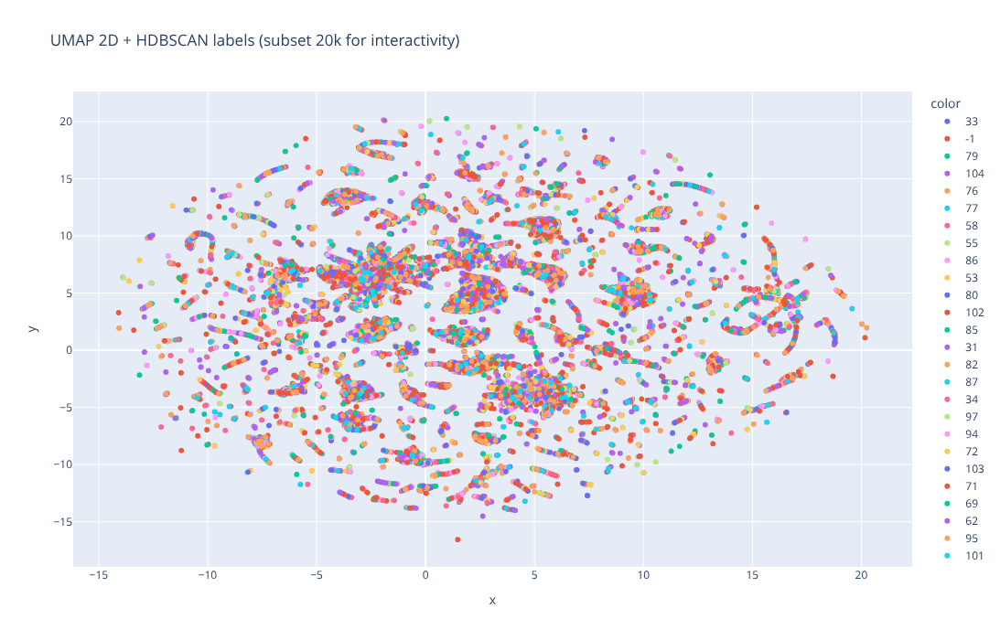

In [11]:

fig = px.scatter(plot_df.sample(min(len(plot_df), X_svd.shape[0])), x='x', y='y',
                 color=plot_df['hdbscan_label'].astype(str),
                 hover_data=['domain','tld','length','num_parts'],
                 title='UMAP 2D + HDBSCAN labels (subset 20k for interactivity)')
fig.update_layout(height=700)
fig.show()

In [12]:
# Let's review our clusters
def cluster_report(label, n=30):
    subset = df[df['hdbscan_label']==label]
    print(f"Cluster {label}  size={len(subset)}")
    display(subset.head(n))
    # top tokens (split on non-alpha)
    tokens = Counter()
    for d in subset['domain_clean'].values:
        for tok in re.split(r'[^a-z0-9]+', d):
            if len(tok) >= 3:
                tokens[tok] += 1
    print("Top tokens:", tokens.most_common(30))

# widget: wybierz klaster do inspekcji
cluster_choices = sorted(df['hdbscan_label'].unique())
sel = widgets.Dropdown(options=cluster_choices, description='Cluster:')
btn = widgets.Button(description="Pokaż raport")
out = widgets.Output()

def on_click(b):
    with out:
        out.clear_output()
        cluster_report(sel.value, n=50)

btn.on_click(on_click)
display(widgets.HBox([sel, btn]), out)

Output()